In [8]:
# 1. Imports and setup
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
import folium


In [10]:
ox.__version__

'2.0.2'

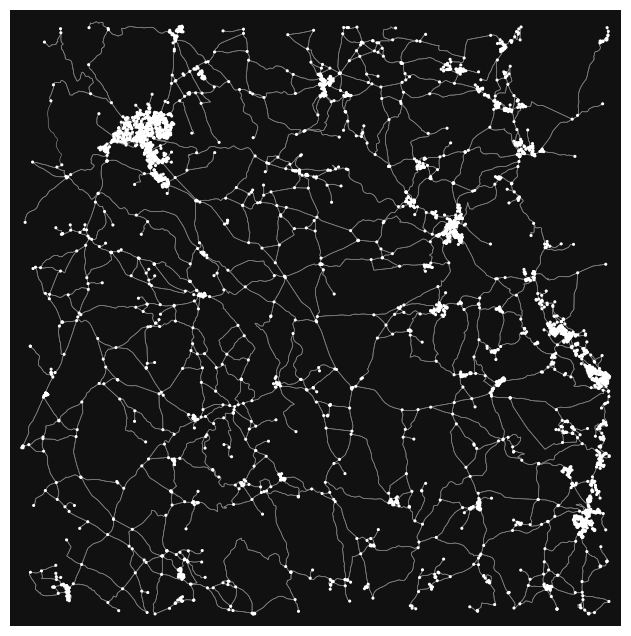

In [19]:

# Configure OSMnx
ox.utils.settings.overpass_rate_limit = False
ox.utils.settings.overpass_url = "https://overpass.kumi.systems/api"


# 2. Define area of interest
center_point = (53.169910, -1.780962)  # 🔁 Replace with your desired lat/lon
dist_meters = 15000              # 🔁 Radius around the point in meters

# 3. Download road network (driveable roads only)
G = ox.graph_from_point(center_point, dist=dist_meters, network_type='drive')

# Optional: simplify the graph
# G = ox.simplify_graph(G)

# 4. Plot static graph
fig, ax = ox.plot_graph(G, node_size=5, edge_color='gray', edge_linewidth=0.5)


In [20]:
# Convert graph to GeoDataFrames
nodes, edges = ox.graph_to_gdfs(G)

# Create a folium map centered on Manchester
m = folium.Map(zoom_start=11, tiles='cartodbpositron')

# Add edges to the map
for _, row in edges.iterrows():
    if isinstance(row['geometry'], list):
        # Skip any weird geometry
        continue
    folium.PolyLine(locations=[(lat, lon) for lon, lat in row['geometry'].coords],
                    color='blue',
                    weight=1).add_to(m)

m

In [ ]:
import zipfile

with zipfile.ZipFile("C://Users\khong\Documents\Python Projects\Drive\Drive\data\great-britain.c_300.kmz", "r") as kmz:
    kmz.extractall("extracted_kml")

<>:3: SyntaxWarning: invalid escape sequence '\k'
<>:3: SyntaxWarning: invalid escape sequence '\k'
C:\Users\khong\AppData\Local\Temp\ipykernel_15528\50680251.py:3: SyntaxWarning: invalid escape sequence '\k'
  with zipfile.ZipFile("C://Users\khong\Documents\Python Projects\Drive\Drive\data\great-britain.c_300.kmz", "r") as kmz:


In [ ]:
import geopandas as gpd

gdf = gpd.read_file("extracted_kml\great-britain\doc.kml", driver='KML')

<>:3: SyntaxWarning: invalid escape sequence '\g'
<>:3: SyntaxWarning: invalid escape sequence '\g'
C:\Users\khong\AppData\Local\Temp\ipykernel_15528\1520658972.py:3: SyntaxWarning: invalid escape sequence '\g'
  gdf = gpd.read_file("extracted_kml\great-britain\doc.kml", driver='KML')


In [ ]:
print(gdf.iloc[0])

Name                                                       B8073
Description    <div style="width: 500px">Curvature: 24835.78<...
geometry       LINESTRING (-5.986953 56.494243, -5.987263 56....
Name: 0, dtype: object


In [ ]:
print(gdf.iloc[0]["Description"])

<div style="width: 500px">Curvature: 24835.78<br/>Distance: 30.82 mi<br/>Type: secondary<br/>Surface: asphalt, unknown<br/><br/>Constituent ways - <em>Open/edit in OpenStreetMap:</em><br/><table style="width: 100%; text-align: center;"><tr><th>View</th><th>Surface</th><th>Curv.</th><th>Length</th><th>Name</th><th>Actions</th></tr><tr><td><a href="https://www.openstreetmap.org/way/1238642203">1238642203</a></td><td>asphalt</td><td>1255</td><td>2.32 mi<br/></td><td></td><td><a href="https://www.openstreetmap.org/edit?way=1238642203#map=16/56.4951/-6.0110">Web Edit</a>, <a href="" onclick="var img=document.createElement('img'); img.style.display='none'; img.src='http://127.0.0.1:8111/load_and_zoom?left=-6.03599&right=-5.98595&top=56.50136&bottom=56.48888&select=way1238642203'; this.parentElement.appendChild(img); return false;">Edit in JOSM</a>, <a href="" onclick="if (this.nextSibling.style.display=='block') {this.nextSibling.style.display='none';} else { this.nextSibling.style.display='

In [ ]:
import geopandas as gpd
from bs4 import BeautifulSoup
import re

# Load the KML file
gdf = gpd.read_file("C:\\Users\khong\Documents\Python Projects\Drive\Drive\data\great-britain.c_300.kml", driver='KML')

# Function to extract the curvature from HTML Description
gdf['curvature'] = [int(float(x[37:42])) for x in gdf["Description"]]


<>:6: SyntaxWarning: invalid escape sequence '\k'
<>:6: SyntaxWarning: invalid escape sequence '\k'
C:\Users\khong\AppData\Local\Temp\ipykernel_15528\1980315945.py:6: SyntaxWarning: invalid escape sequence '\k'
  gdf = gpd.read_file("C:\\Users\khong\Documents\Python Projects\Drive\Drive\data\great-britain.c_300.kml", driver='KML')


In [ ]:
curvature_gdf = gdf

from shapely.geometry import LineString
import geopandas as gpd

# Ensure both GeoDataFrames use the same CRS
edges = edges.to_crs("EPSG:4326")
curvature_gdf = curvature_gdf.to_crs("EPSG:4326")


# Spatial join with max distance (tune as needed)
edges_with_curviness = gpd.sjoin_nearest(
    edges,
    curvature_gdf[['geometry', 'curvature']],
    how="left",
    max_distance=0.0005,  # ~100 meters
    distance_col="join_dist"
)

# Fill missing curvature with 0
edges_with_curviness['curvature'] = edges_with_curviness['curvature'].fillna(0)

# (Optional) Drop join_dist and index_right if not needed
edges_with_curviness.drop(columns=['join_dist', 'index_right'], inplace=True)

# drop duplicate indeces
edges_with_curviness = edges_with_curviness[~edges_with_curviness.index.duplicated(keep='first')]

# Done! All edges should now be present with curvature values (real or default)
print(len(edges_with_curviness))
print(len(edges))

c:\Users\khong\Documents\Python Projects\Drive\Drive\venv\Lib\site-packages\geopandas\array.py:403: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(


5367
5367


In [ ]:
edges_with_curviness

osmid  \
u           v           key                                                      
683143      937868533   0                                 [22968456, 42207856]   
            248934093   0                                             42207857   
683154      367118648   0                                             32654990   
            367110607   0                                            324560235   
            1026599169  0                    [324560235, 324560236, 540186437]   
...                                                                        ...   
12394261613 11050471621 0                                           1190103969   
12394261615 11050471621 0                                           1339889869   
12779803189 97895515    0                                            370008102   
            2361345024  0                                            227470475   
            8010246     0    [370008102, 8101834, 114407437, 114407438, 114...   

                            access         highway                  name  \
u           v           key                                                
683143      937868533   0      yes    unclassified        Dale Head Lane   
            248934093   0      NaN           trunk             Leek Road   
683154      367118648   0      NaN    unclassified       Summerhill Lane   
            367110607   0      NaN           trunk             Leek Road   
            1026599169  0      NaN           trunk             Leek Road   
...                            ...             ...                   ...   
12394261613 11050471621 0      NaN     residential  Colonel Wright Close   
12394261615 11050471621 0      NaN     residential  Colonel Wright Close   
12779803189 97895515    0      NaN           trunk                   NaN   
            2361345024  0      NaN  secondary_link                   NaN   
            8010246     0      NaN           trunk                   NaN   

                             oneway reversed       length  \
u           v           key                                 
683143      937868533   0     False    False  2460.412070   
            248934093   0     False    False    17.305863   
683154      367118648   0     False    False   142.571196   
            367110607   0     False    False   414.488922   
            1026599169  0     False     True   121.425709   
...                             ...      ...          ...   
12394261613 11050471621 0     False    False    18.646188   
12394261615 11050471621 0     False     True     8.207160   
12779803189 97895515    0     False    False    32.624401   
            2361345024  0      True    False    37.061430   
            8010246     0     False     True   188.266787   

                                                                      geometry  \
u           v           key                                                      
683143      937868533   0    LINESTRING (-1.94683 53.22826, -1.94672 53.228...   
            248934093   0    LINESTRING (-1.94683 53.22826, -1.94689 53.228...   
683154      367118648   0    LINESTRING (-1.95371 53.20774, -1.95344 53.207...   
            367110607   0    LINESTRING (-1.95371 53.20774, -1.9537 53.2076...   
            1026599169  0    LINESTRING (-1.95371 53.20774, -1.95377 53.207...   
...                                                                        ...   
12394261613 11050471621 0     LINESTRING (-1.68603 53.2094, -1.68595 53.20924)   
12394261615 11050471621 0    LINESTRING (-1.68587 53.20918, -1.68595 53.20924)   
12779803189 97895515    0    LINESTRING (-1.70535 53.22395, -1.70529 53.22424)   
            2361345024  0    LINESTRING (-1.70535 53.22395, -1.70539 53.224...   
            8010246     0    LINESTRING (-1.70535 53.22395, -1.70536 53.223...   

                            lanes maxspeed    ref bridge width junction  \
u           v           key                                               
683143

In [ ]:
# Create a folium map centered on Manchester
m = folium.Map(zoom_start=11, tiles='cartodbpositron')

def get_color(val, vmin, vmax):
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    cmap = plt.get_cmap('viridis')
    rgba = cmap(norm(val))
    return f'rgba({int(rgba[0]*255)}, {int(rgba[1]*255)}, {int(rgba[2]*255)}, {rgba[3]})'

# # Add non curvature mapped edges to the map
# for _, row in edges.iterrows():
#     if isinstance(row['geometry'], list):
#         # Skip any weird geometry
#         continue
#     folium.PolyLine(locations=[(lat, lon) for lon, lat in row['geometry'].coords],
#                     color='red',
#                     weight=1).add_to(m)

# Add edges to the map
for _, row in edges_with_curviness.iterrows():
    if isinstance(row['geometry'], list):
        # Skip any weird geometry
        continue
    folium.PolyLine(locations=[(lat, lon) for lon, lat in row['geometry'].coords],
                    color=get_color(row['curvature'], edges_with_curviness['curvature'].min(), edges_with_curviness['curvature'].max()),
                    weight=1).add_to(m)


# colormap = plt.colormaps
# colormap.add_to(m)

m

In [ ]:
# from shapely.geometry import Point

# # Ensure edges have geometry
# assert 'geometry' in edges_with_curviness.columns

# # Build nodes GeoDataFrame by extracting start/end points
# nodes_set = set()
# for geom in edges_with_curviness.geometry:
#     if geom is not None and not geom.is_empty:
#         nodes_set.add(geom.coords[0])
#         nodes_set.add(geom.coords[-1])

# # Create nodes GeoDataFrame
# nodes_list = list(nodes_set)
# nodes_gdf = gpd.GeoDataFrame(
#     {"geometry": [Point(xy) for xy in nodes_list]},
#     crs=edges.crs
# )

# # Add 'x' and 'y' columns (required by OSMnx)
# nodes_gdf["x"] = nodes_gdf.geometry.x
# nodes_gdf["y"] = nodes_gdf.geometry.y

nodes_gdf = nodes.copy()


In [ ]:
# Reconstruct the graph
G = ox.graph_from_gdfs(nodes_gdf, edges_with_curviness)
